In [ ]:
import os
import sys


sys.path.append(os.path.abspath(os.path.join(os.path.dirname("__file__"), "src")))

In [ ]:
import torch


# env_name = "button-press-topdown-v2"
env_name = "box-close-v2"
exp_name = "AESPA-17"
pair_algo = "ternary-100"
reward_model_algo = "MR-linear"

os.environ["CUDA_VISIBLE_DEVICES"] = "4" 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

TRAJECTORY_LENGTH = 25

import numpy as np
from data_generation.utils import save_feedbacks_npz
from data_loading.load_data import load_pair
from data_loading.load_data import load_dataset
from reward_learning.get_model import get_reward_model
from utils.path import get_reward_model_path

In [ ]:
import glob


def predict_rewards(
    env_name,
    exp_name,
    pair_algo,
    reward_model_algo,
):
    dataset = load_dataset(env_name)
    obs_dim = dataset["observations"].shape[1]
    act_dim = dataset["actions"].shape[1]

    print("obs_dim:", obs_dim, "act_dim:", act_dim)
    model_path_pattern = get_reward_model_path(
        env_name=env_name,
        exp_name=exp_name,
        pair_algo=pair_algo,
        reward_model_algo=reward_model_algo,
        reward_model_tag="*",
    )
    model_files = glob.glob(model_path_pattern)
    model_list = []

    for model_file in model_files:
        model, _ = get_reward_model(
            reward_model_algo=reward_model_algo,
            obs_dim=obs_dim,
            act_dim=act_dim,
            model_path=model_file,
            allow_existing=True,
        )
        model_list.append(model)

    dataset = load_dataset(env_name)

    num_samples = len(dataset["observations"])
    batch_size = num_samples // 20
    model_outputs = []

    for start_idx in range(0, num_samples, batch_size):
        end_idx = min(start_idx + batch_size, num_samples)

        obs_batch = torch.tensor(
            dataset["observations"][start_idx:end_idx], dtype=torch.float32
        ).to(device)
        act_batch = torch.tensor(
            dataset["actions"][start_idx:end_idx], dtype=torch.float32
        ).to(device)

        batch_model_outputs = []
        for model in model_list:
            rewards = model.batched_forward_trajectory(
                obs_batch=obs_batch, act_batch=act_batch
            )
            batch_model_outputs.append(rewards.detach().cpu().numpy())

        batch_predicted_rewards = np.mean(batch_model_outputs, axis=0)
        model_outputs.append(batch_predicted_rewards)

    predicted_rewards = np.concatenate(model_outputs, axis=0).squeeze()

    return predicted_rewards


In [ ]:
def fill_feedback_from_raw_dataset(average_reward, cumulative_rewards, pairs):
    """
    Fill feedback in dataset using cumulative rewards and calculate mu values.
    """

    feedbacks = []

    for s0, s1 in pairs:
        sum_of_rewards_0 = cumulative_rewards[s0[1] - 1] - (
            cumulative_rewards[s0[0] - 1] if s0[0] > 0 else 0
        )
        sum_of_rewards_1 = cumulative_rewards[s1[1] - 1] - (
            cumulative_rewards[s1[0] - 1] if s1[0] > 0 else 0
        )

        if (
            np.abs(sum_of_rewards_0 - sum_of_rewards_1)
            < average_reward * TRAJECTORY_LENGTH * 0.1
        ):
            mu = 0.5
        else:
            mu = 0 if sum_of_rewards_0 > sum_of_rewards_1 else 1

        feedbacks.append((s0, s1, mu))

    return feedbacks


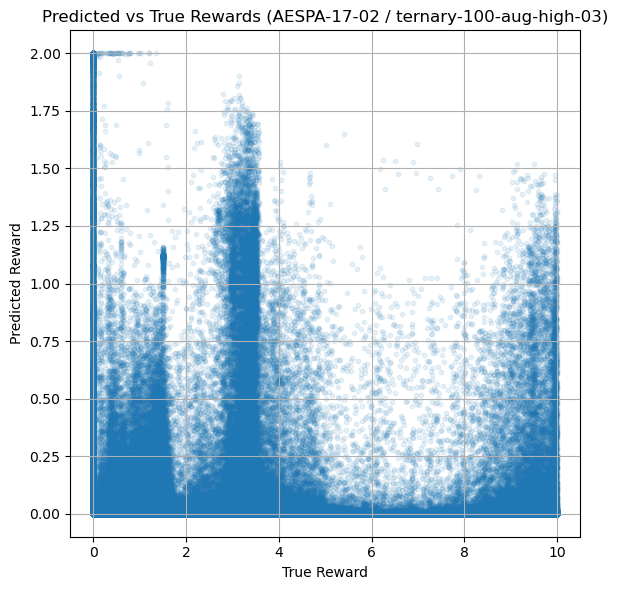

[AESPA-17-02]
  PCC (Pearson Correlation): 0.0538
  Order Agreement (100000 pairs): 0.6529

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-04/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-04/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-04/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-04/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-04/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-04/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-04/MR-linear_04.pth


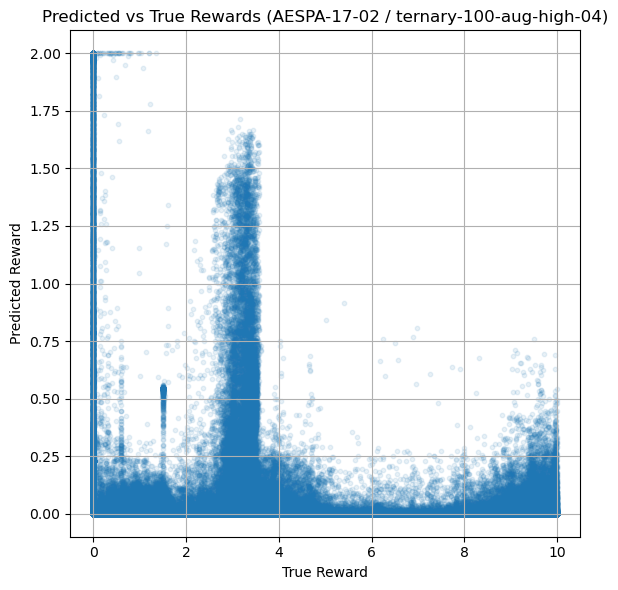

[AESPA-17-02]
  PCC (Pearson Correlation): 0.0069
  Order Agreement (100000 pairs): 0.6537

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-05/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-05/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-05/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-05/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-05/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-05/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-05/MR-linear_04.pth


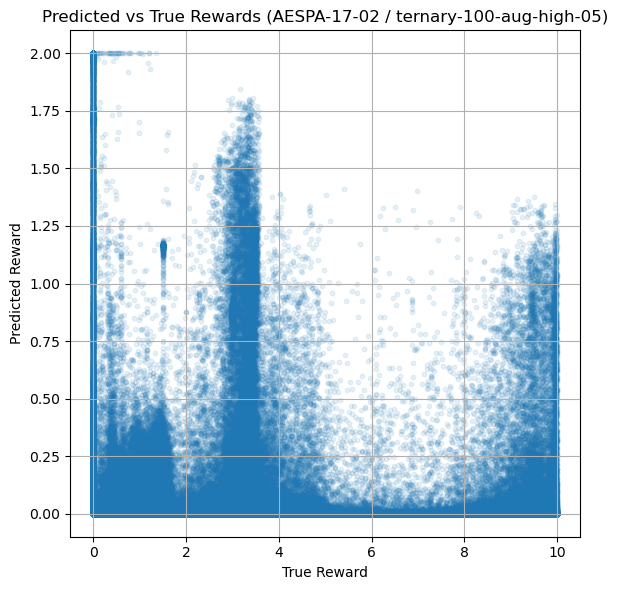

[AESPA-17-02]
  PCC (Pearson Correlation): 0.0551
  Order Agreement (100000 pairs): 0.6686

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-06/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-06/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-06/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-06/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-06/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-06/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-06/MR-linear_04.pth


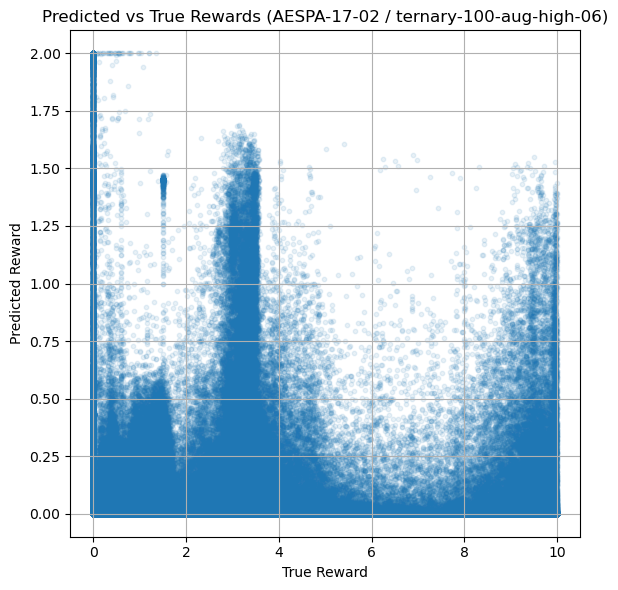

[AESPA-17-02]
  PCC (Pearson Correlation): 0.0886
  Order Agreement (100000 pairs): 0.6650

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-07/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-07/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-07/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-07/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-07/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-07/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-07/MR-linear_04.pth


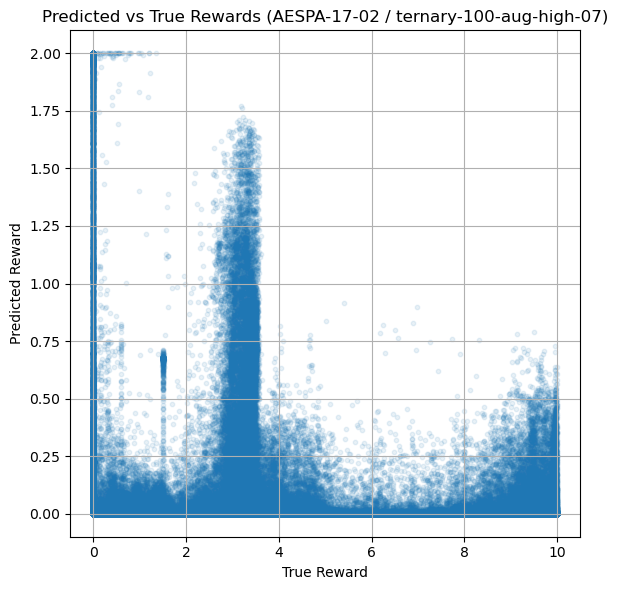

[AESPA-17-02]
  PCC (Pearson Correlation): 0.0136
  Order Agreement (100000 pairs): 0.6511

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-08/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-08/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-08/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-08/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-08/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-08/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-08/MR-linear_04.pth


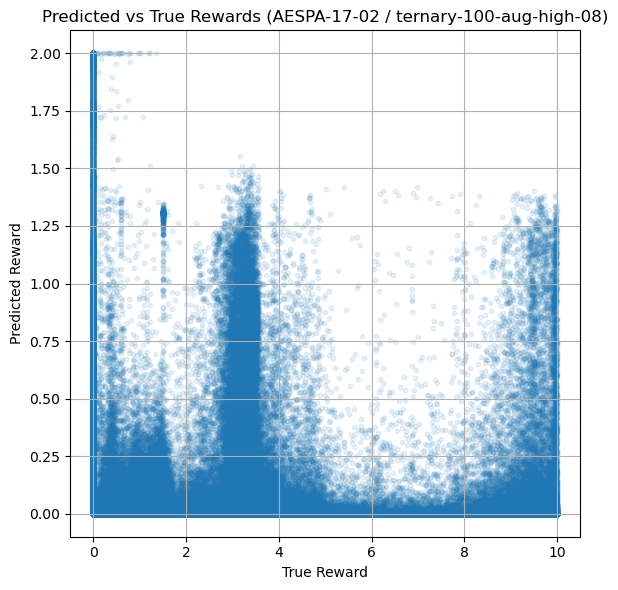

[AESPA-17-02]
  PCC (Pearson Correlation): 0.0475
  Order Agreement (100000 pairs): 0.6509

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-09/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-09/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-09/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-09/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-09/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-09/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-02/reward/ternary-100-aug-high-09/MR-linear_04.pth


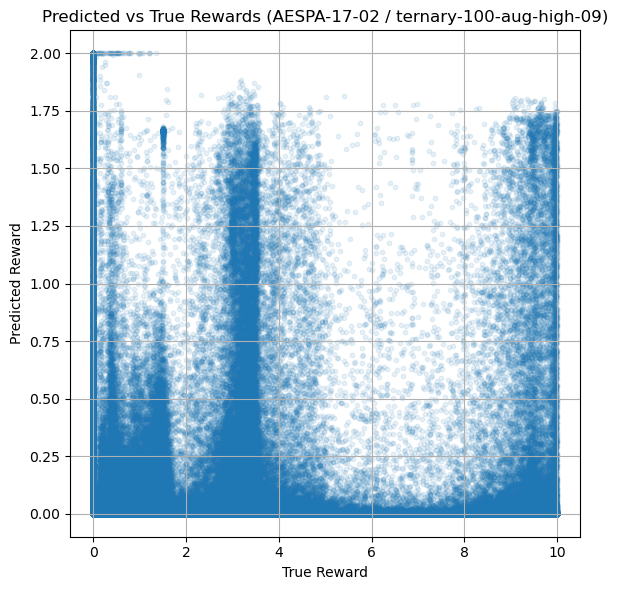

[AESPA-17-02]
  PCC (Pearson Correlation): 0.0839
  Order Agreement (100000 pairs): 0.6573

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-00/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-00/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-00/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-00/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-00/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-00/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-00/MR-linear_04.pth


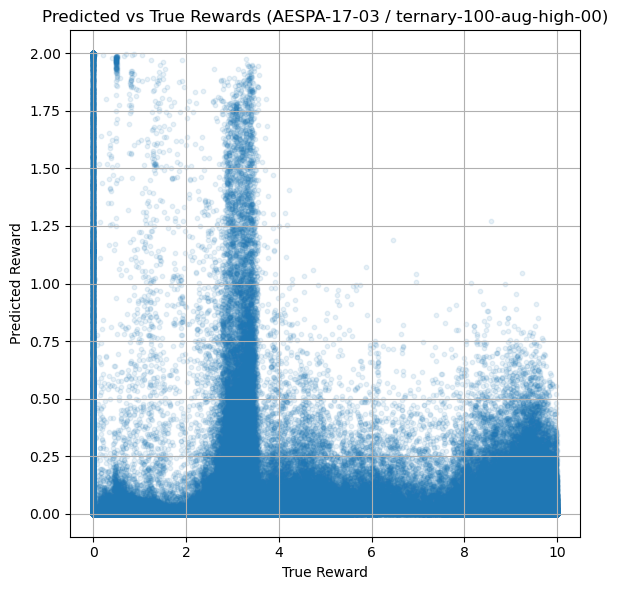

[AESPA-17-03]
  PCC (Pearson Correlation): 0.1267
  Order Agreement (100000 pairs): 0.7128

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-01/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-01/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-01/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-01/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-01/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-01/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-01/MR-linear_04.pth


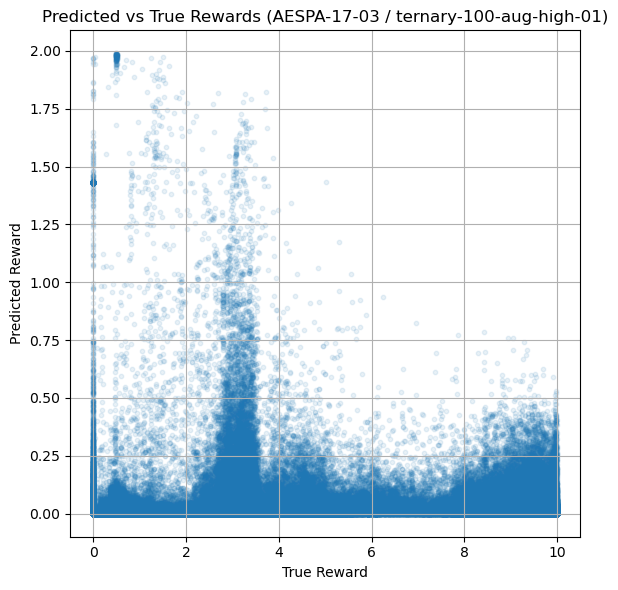

[AESPA-17-03]
  PCC (Pearson Correlation): 0.1923
  Order Agreement (100000 pairs): 0.7154

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-02/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-02/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-02/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-02/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-02/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-02/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-02/MR-linear_04.pth


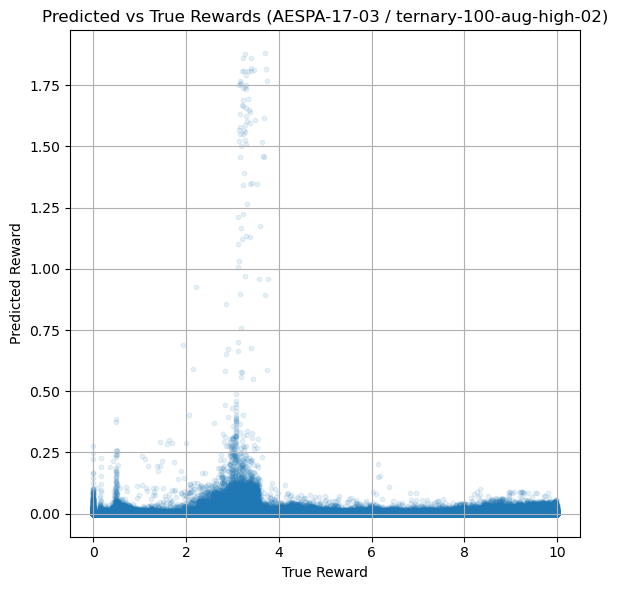

[AESPA-17-03]
  PCC (Pearson Correlation): 0.1082
  Order Agreement (100000 pairs): 0.7092

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-03/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-03/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-03/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-03/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-03/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-03/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-03/MR-linear_04.pth


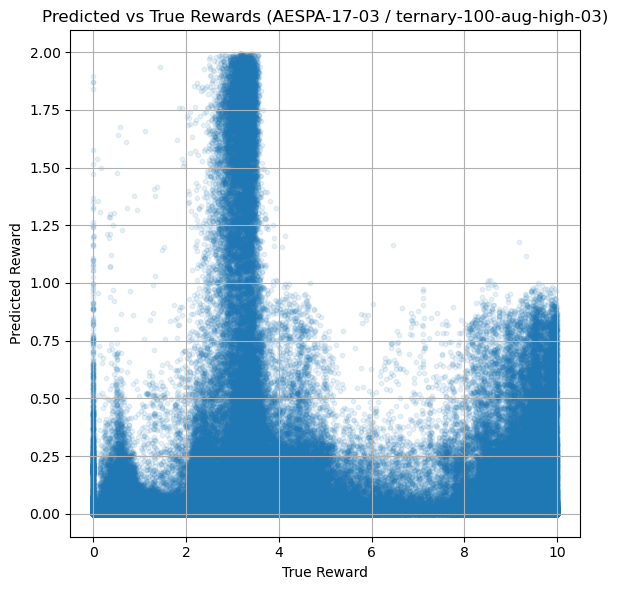

[AESPA-17-03]
  PCC (Pearson Correlation): 0.2579
  Order Agreement (100000 pairs): 0.7009

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-04/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-04/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-04/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-04/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-04/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-04/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-04/MR-linear_04.pth


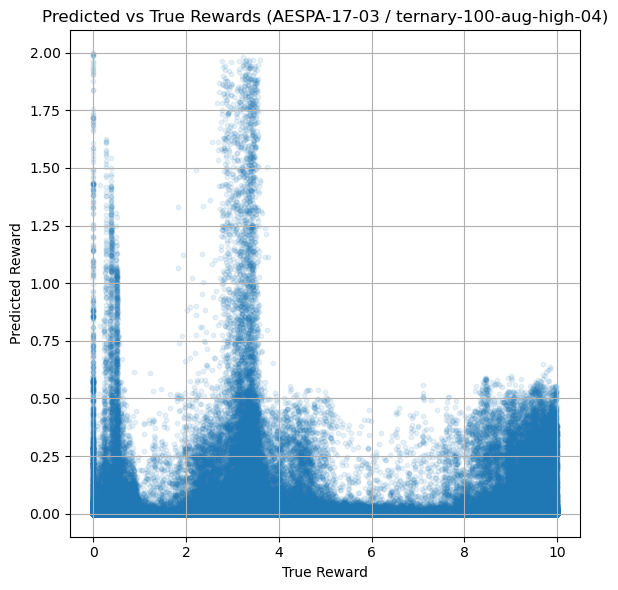

[AESPA-17-03]
  PCC (Pearson Correlation): 0.1818
  Order Agreement (100000 pairs): 0.7137

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-05/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-05/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-05/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-05/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-05/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-05/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-05/MR-linear_04.pth


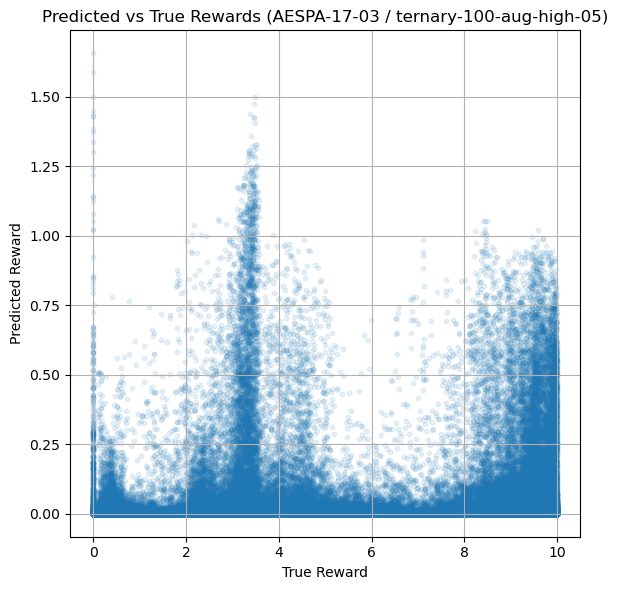

[AESPA-17-03]
  PCC (Pearson Correlation): 0.2587
  Order Agreement (100000 pairs): 0.7154

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-06/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-06/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-06/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-06/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-06/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-06/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-06/MR-linear_04.pth


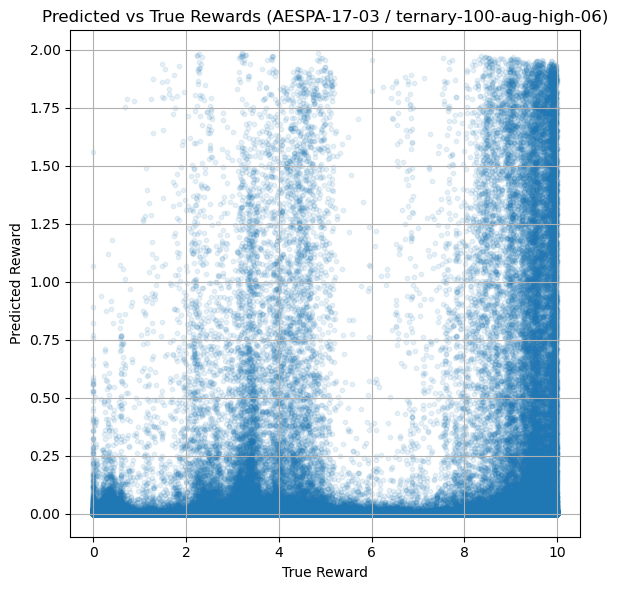

[AESPA-17-03]
  PCC (Pearson Correlation): 0.3200
  Order Agreement (100000 pairs): 0.7167

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-07/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-07/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-07/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-07/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-07/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-07/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-07/MR-linear_04.pth


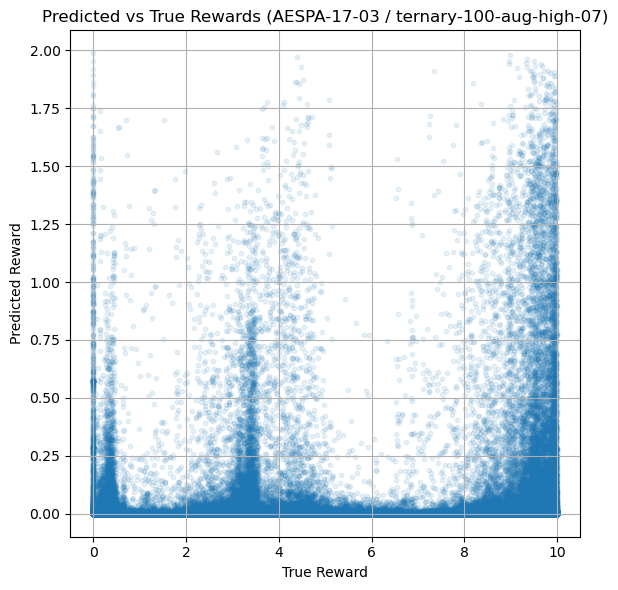

[AESPA-17-03]
  PCC (Pearson Correlation): 0.1948
  Order Agreement (100000 pairs): 0.7043

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-08/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-08/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-08/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-08/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-08/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-08/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-08/MR-linear_04.pth


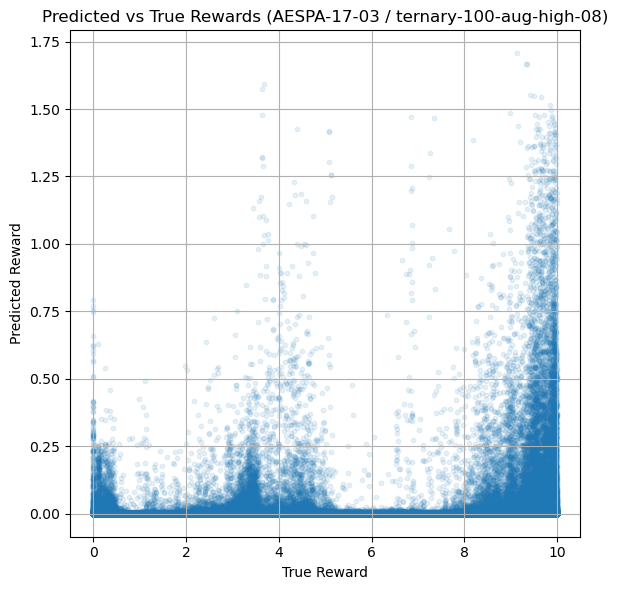

[AESPA-17-03]
  PCC (Pearson Correlation): 0.2073
  Order Agreement (100000 pairs): 0.7107

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-09/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-09/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-09/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-09/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-09/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-09/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-03/reward/ternary-100-aug-high-09/MR-linear_04.pth


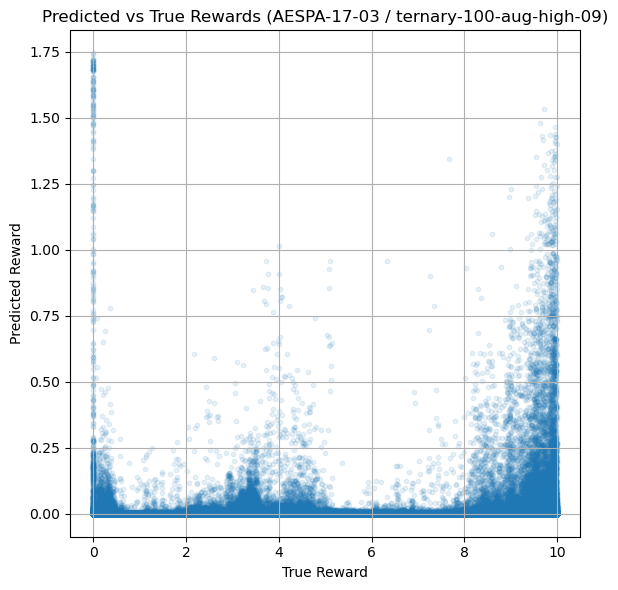

[AESPA-17-03]
  PCC (Pearson Correlation): 0.1511
  Order Agreement (100000 pairs): 0.6988

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-00/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-00/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-00/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-00/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-00/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-00/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-00/MR-linear_04.pth


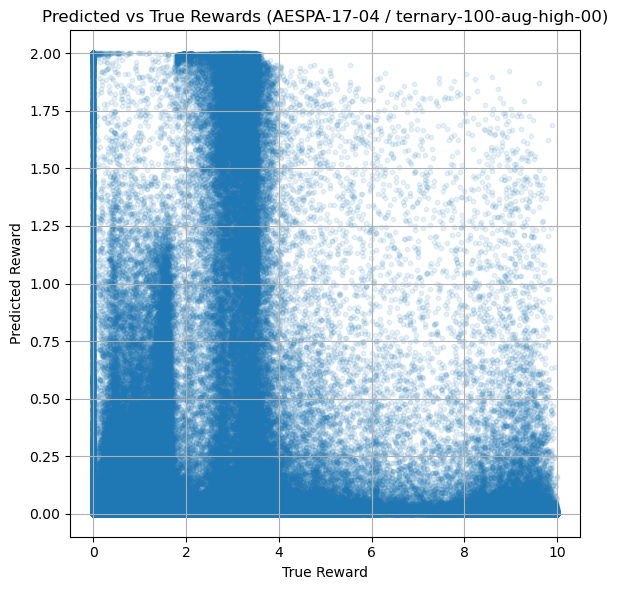

[AESPA-17-04]
  PCC (Pearson Correlation): 0.1152
  Order Agreement (100000 pairs): 0.7275

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-01/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-01/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-01/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-01/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-01/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-01/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-01/MR-linear_04.pth


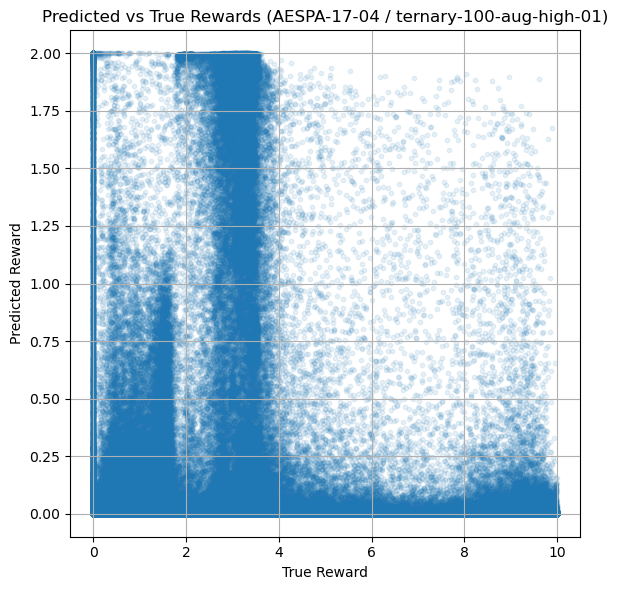

[AESPA-17-04]
  PCC (Pearson Correlation): 0.0976
  Order Agreement (100000 pairs): 0.6884

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-02/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-02/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-02/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-02/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-02/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-02/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-02/MR-linear_04.pth


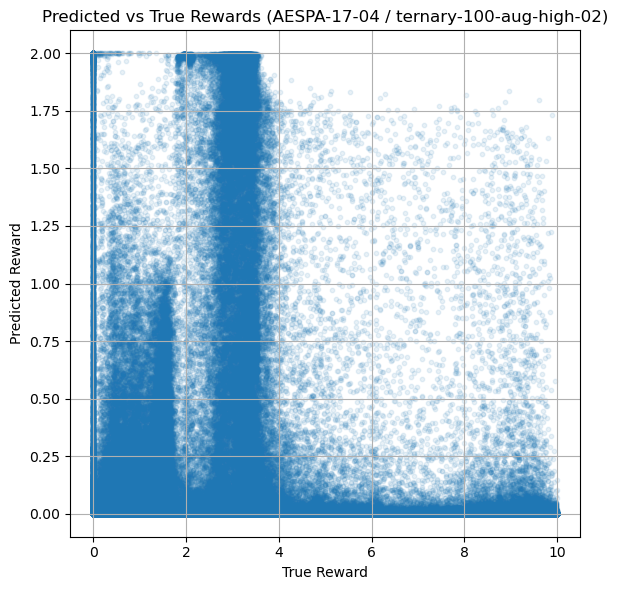

[AESPA-17-04]
  PCC (Pearson Correlation): 0.0855
  Order Agreement (100000 pairs): 0.6741

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-03/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-03/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-03/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-03/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-03/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-03/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-03/MR-linear_04.pth


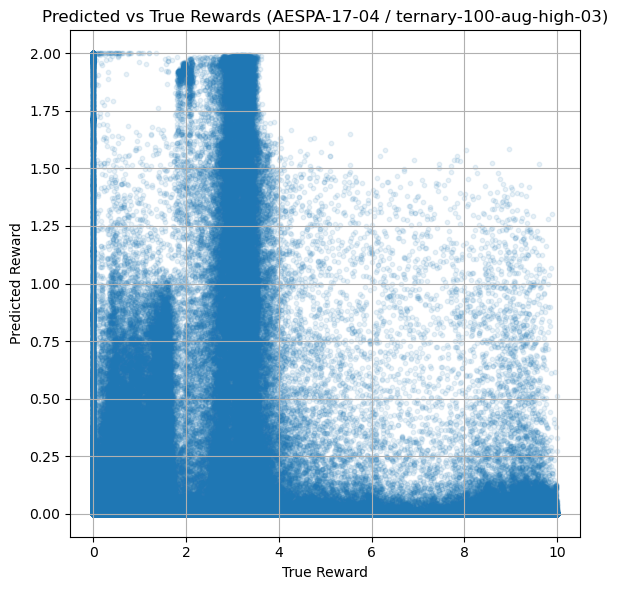

[AESPA-17-04]
  PCC (Pearson Correlation): 0.0848
  Order Agreement (100000 pairs): 0.6723

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-04/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-04/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-04/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-04/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-04/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-04/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-04/MR-linear_04.pth


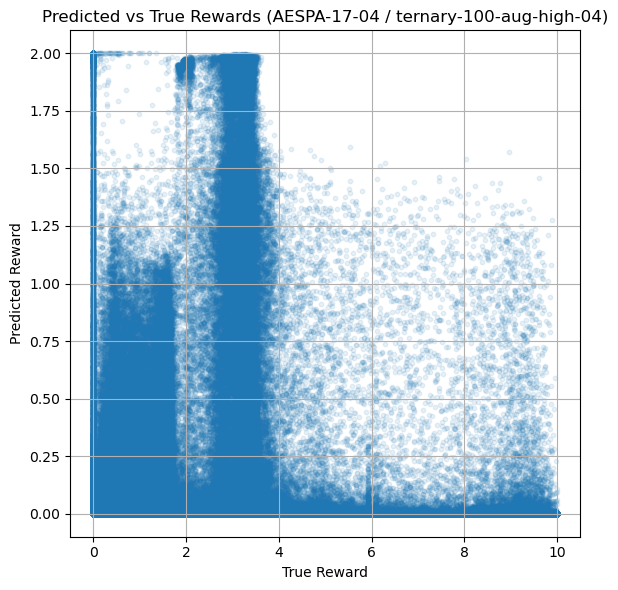

[AESPA-17-04]
  PCC (Pearson Correlation): 0.0755
  Order Agreement (100000 pairs): 0.6796

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-05/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-05/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-05/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-05/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-05/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-05/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-05/MR-linear_04.pth


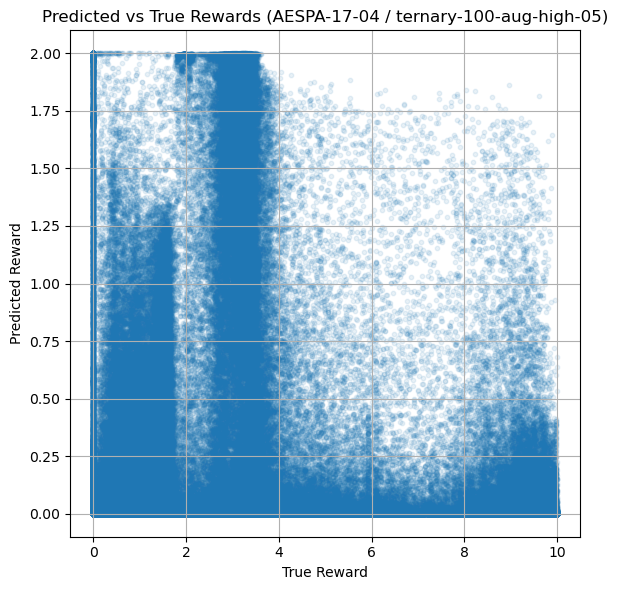

[AESPA-17-04]
  PCC (Pearson Correlation): 0.1217
  Order Agreement (100000 pairs): 0.6952

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-06/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-06/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-06/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-06/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-06/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-06/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-06/MR-linear_04.pth


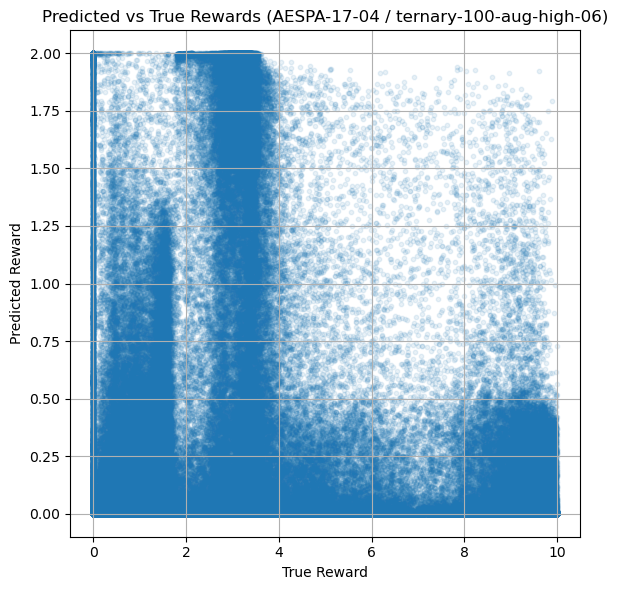

[AESPA-17-04]
  PCC (Pearson Correlation): 0.1401
  Order Agreement (100000 pairs): 0.7048

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-07/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-07/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-07/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-07/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-07/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-07/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-07/MR-linear_04.pth


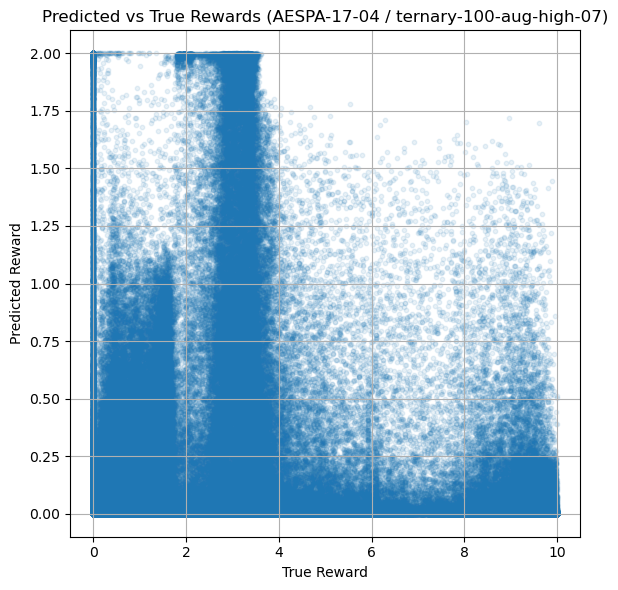

[AESPA-17-04]
  PCC (Pearson Correlation): 0.1116
  Order Agreement (100000 pairs): 0.6676

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-08/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-08/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-08/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-08/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-08/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-08/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-08/MR-linear_04.pth


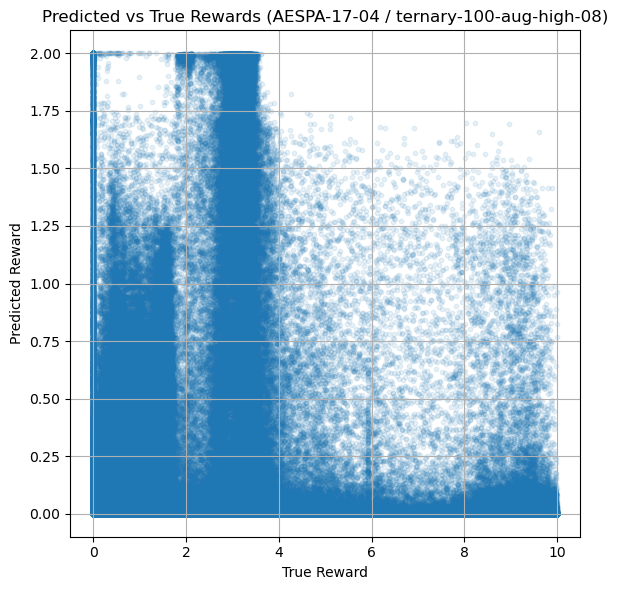

[AESPA-17-04]
  PCC (Pearson Correlation): 0.0987
  Order Agreement (100000 pairs): 0.6621

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-09/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-09/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-09/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-09/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-09/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-09/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-04/reward/ternary-100-aug-high-09/MR-linear_04.pth


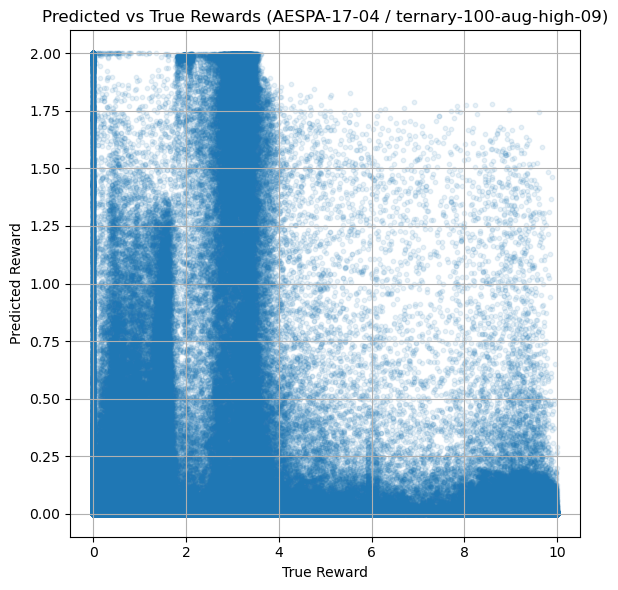

[AESPA-17-04]
  PCC (Pearson Correlation): 0.1033
  Order Agreement (100000 pairs): 0.6919

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-00/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-00/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-00/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-00/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-00/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-00/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-00/MR-linear_04.pth


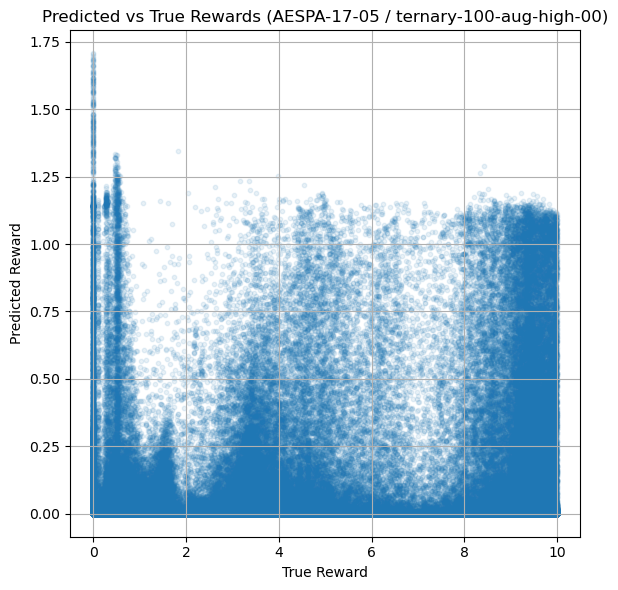

[AESPA-17-05]
  PCC (Pearson Correlation): 0.3370
  Order Agreement (100000 pairs): 0.7159

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-01/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-01/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-01/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-01/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-01/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-01/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-01/MR-linear_04.pth


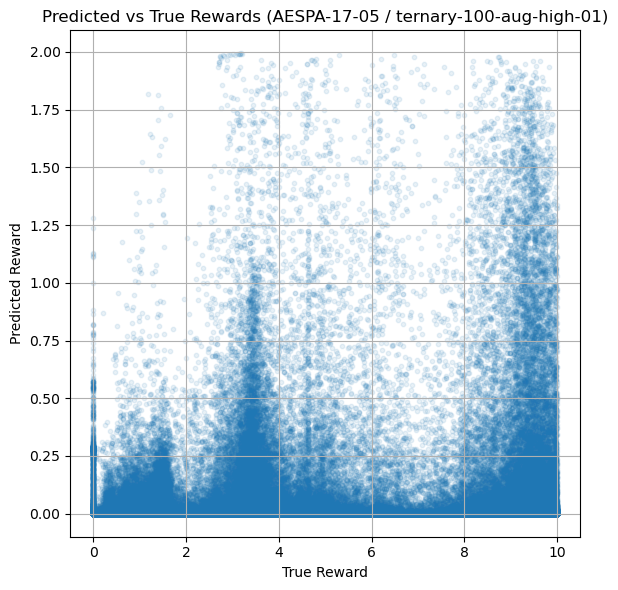

[AESPA-17-05]
  PCC (Pearson Correlation): 0.2460
  Order Agreement (100000 pairs): 0.6524

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-02/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-02/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-02/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-02/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-02/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-02/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-02/MR-linear_04.pth


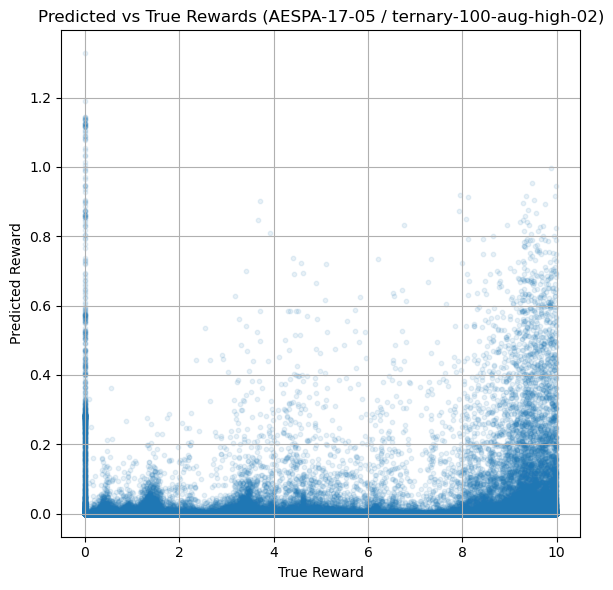

[AESPA-17-05]
  PCC (Pearson Correlation): 0.1365
  Order Agreement (100000 pairs): 0.6076

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-03/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-03/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-03/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-03/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-03/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-03/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-03/MR-linear_04.pth


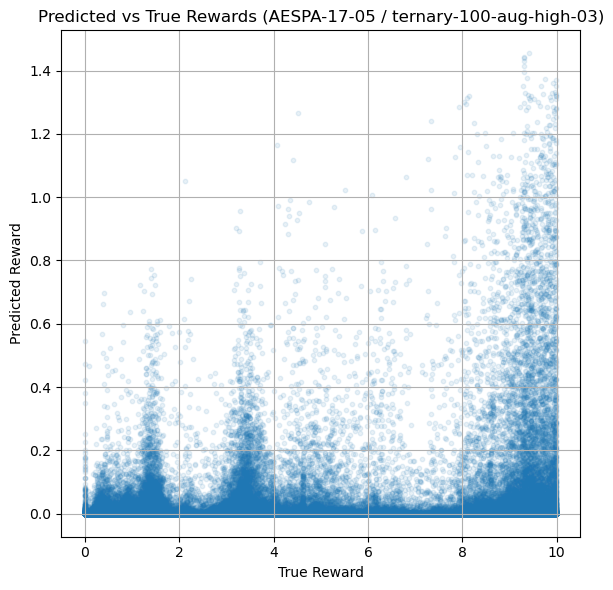

[AESPA-17-05]
  PCC (Pearson Correlation): 0.1699
  Order Agreement (100000 pairs): 0.5951

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-04/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-04/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-04/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-04/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-04/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-04/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-04/MR-linear_04.pth


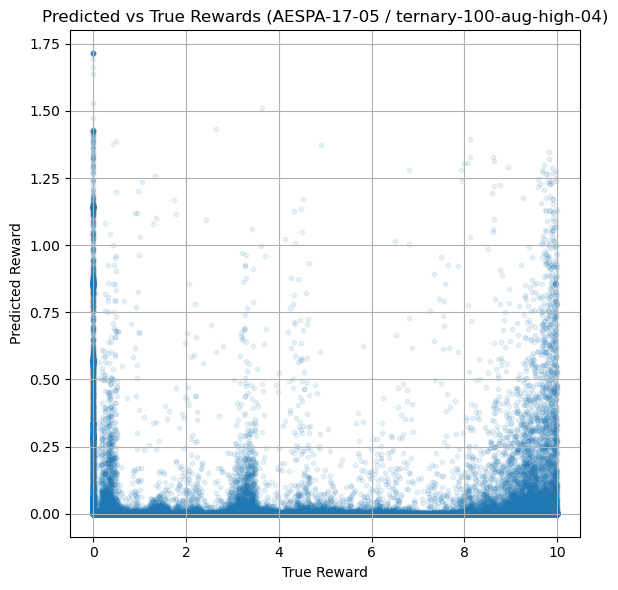

[AESPA-17-05]
  PCC (Pearson Correlation): 0.0483
  Order Agreement (100000 pairs): 0.5938

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-05/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-05/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-05/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-05/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-05/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-05/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-05/MR-linear_04.pth


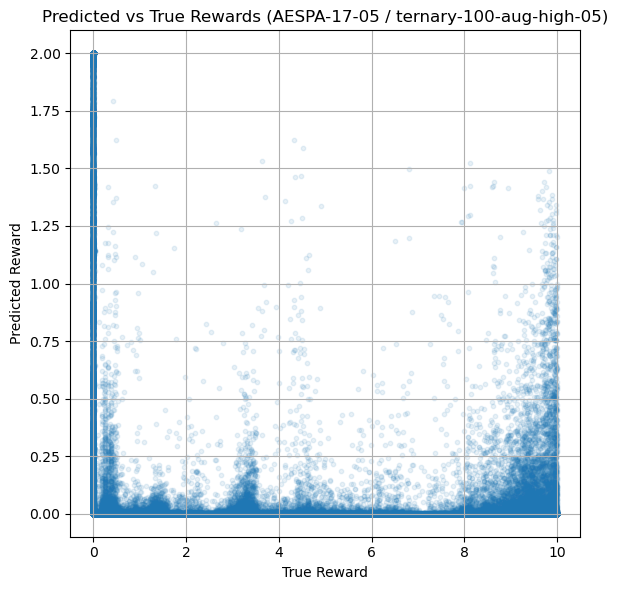

[AESPA-17-05]
  PCC (Pearson Correlation): -0.0440
  Order Agreement (100000 pairs): 0.5740

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-06/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-06/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-06/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-06/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-06/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-06/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-06/MR-linear_04.pth


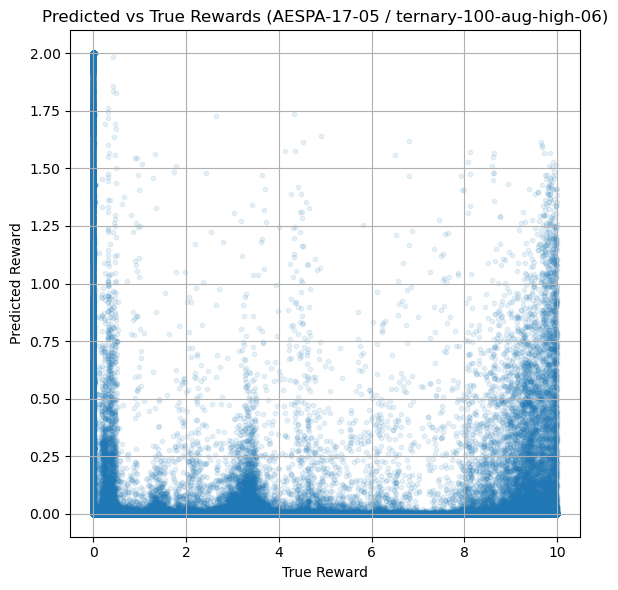

[AESPA-17-05]
  PCC (Pearson Correlation): -0.0469
  Order Agreement (100000 pairs): 0.5556

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-07/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-07/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-07/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-07/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-07/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-07/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-07/MR-linear_04.pth


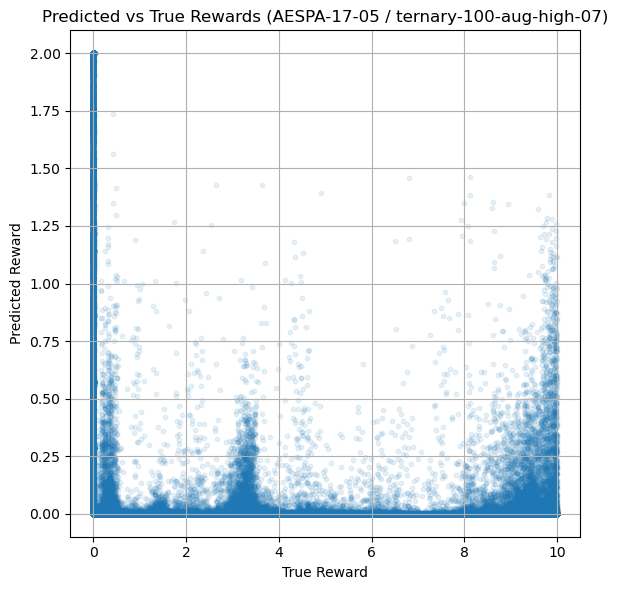

[AESPA-17-05]
  PCC (Pearson Correlation): -0.0655
  Order Agreement (100000 pairs): 0.5402

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-08/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-08/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-08/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-08/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-08/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-08/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-08/MR-linear_04.pth


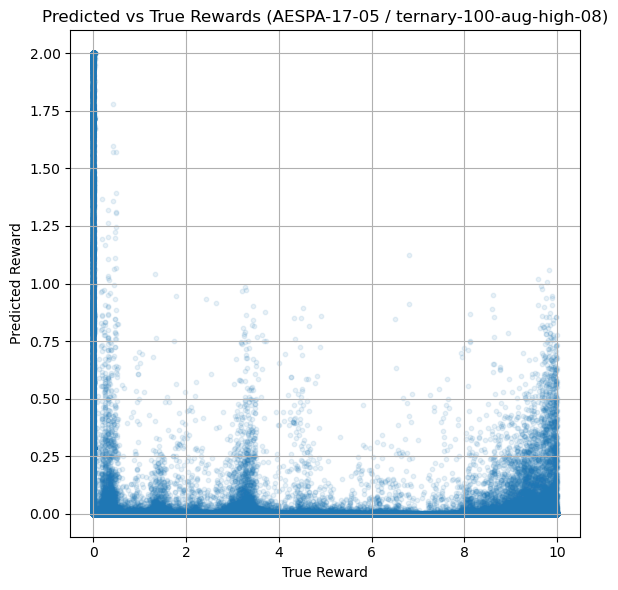

[AESPA-17-05]
  PCC (Pearson Correlation): -0.0715
  Order Agreement (100000 pairs): 0.5497

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-09/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-09/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-09/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-09/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-09/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-09/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-05/reward/ternary-100-aug-high-09/MR-linear_04.pth


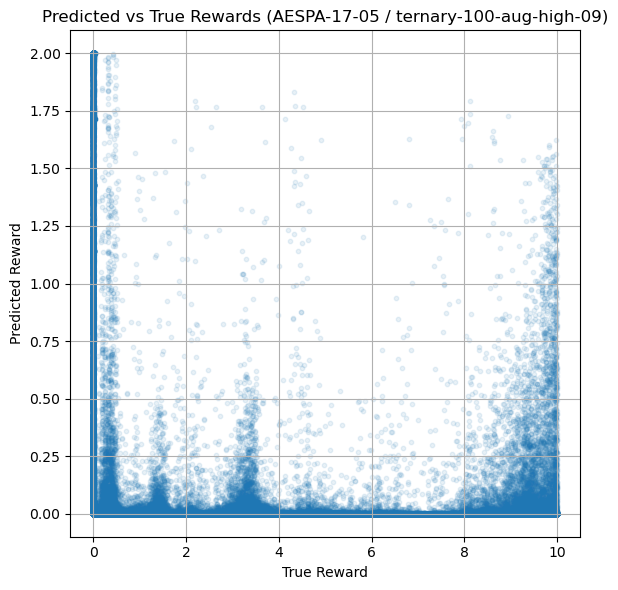

[AESPA-17-05]
  PCC (Pearson Correlation): -0.0710
  Order Agreement (100000 pairs): 0.5423

obs_dim: 39 act_dim: 4
Model loaded from model/box-close-v2/AESPA-17-06/reward/ternary-100-aug-high-00/MR-linear_02.pth
Model loaded from model/box-close-v2/AESPA-17-06/reward/ternary-100-aug-high-00/MR-linear_06.pth
Model loaded from model/box-close-v2/AESPA-17-06/reward/ternary-100-aug-high-00/MR-linear_01.pth
Model loaded from model/box-close-v2/AESPA-17-06/reward/ternary-100-aug-high-00/MR-linear_00.pth
Model loaded from model/box-close-v2/AESPA-17-06/reward/ternary-100-aug-high-00/MR-linear_05.pth
Model loaded from model/box-close-v2/AESPA-17-06/reward/ternary-100-aug-high-00/MR-linear_03.pth
Model loaded from model/box-close-v2/AESPA-17-06/reward/ternary-100-aug-high-00/MR-linear_04.pth


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import csv

dataset = load_dataset(env_name)

save_dir = "reward_eval_stats"
os.makedirs(save_dir, exist_ok=True)

csv_path = os.path.join(save_dir, "reward_eval_summary.csv")

write_header = not os.path.exists(csv_path)
if write_header:
    with open(csv_path, mode="w", newline="") as file:
        writer = csv.writer(file)
        writer.writerow(["env_name", "exp_name", "pair_algo", "pcc", "order_agreement"])

for i in range(10):
    exp_name_with_suffix = f"{exp_name}-{i:02d}"
    for j in range(10):
        current_pair_algo = f"ternary-100-aug-high-{j:02d}"
        predicted_rewards = predict_rewards(
            env_name=env_name,
            exp_name=exp_name_with_suffix,
            pair_algo=current_pair_algo,
            reward_model_algo=reward_model_algo,
        )

        true_rewards = dataset["rewards"]

        true_rewards = np.array(true_rewards).flatten()
        predicted_rewards = np.array(predicted_rewards).flatten()

        plt.figure(figsize=(6, 6))
        plt.scatter(true_rewards, predicted_rewards, alpha=0.1, s=10, label="Samples")
        plt.xlabel("True Reward")
        plt.ylabel("Predicted Reward")
        plt.title(f"Predicted vs True Rewards ({exp_name_with_suffix} / {current_pair_algo})")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        try:
            pcc = np.corrcoef(true_rewards, predicted_rewards)[0, 1]
        except Exception as e:
            print(f"[{exp_name_with_suffix}] PCC 계산 중 오류 발생: {e}")
            pcc = float('nan')

        num_samples = 100000
        agree = 0
        n = len(true_rewards)

        for _ in range(num_samples):
            i1, i2 = random.sample(range(n), 2)
            gt_diff = true_rewards[i1] - true_rewards[i2]
            pred_diff = predicted_rewards[i1] - predicted_rewards[i2]

            if gt_diff * pred_diff > 0 or (gt_diff == 0 and pred_diff == 0):
                agree += 1

        order_agreement = agree / num_samples

        with open(csv_path, mode="a", newline="") as file:
            writer = csv.writer(file)
            writer.writerow([
                env_name,
                exp_name_with_suffix,
                current_pair_algo,
                f"{pcc:.6f}",
                f"{order_agreement:.6f}",
            ])

        print(f"[{exp_name_with_suffix}]")
        print(f"  PCC (Pearson Correlation): {pcc:.4f}")
        print(f"  Order Agreement ({num_samples} pairs): {order_agreement:.4f}")
        print()